In [1]:
import sys
import importlib
import os
# make the module available from the src directory
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [2]:
from src.dataLoaders.PatientDataLoader import PatientDataProcessor
importlib.reload(sys.modules['src.dataLoaders.PatientDataLoader'])

<module 'src.dataLoaders.PatientDataLoader' from '/Users/mraabo/computer_science/year_3/bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/PatientDataLoader.py'>

In [3]:
meta_folder = 'OAIData21/'
data_path = '../datasets/meta_data/' + meta_folder
# visit = 0

processor = PatientDataProcessor(base_path=data_path)
# processor.load_all_clinical_data(visit_nos=[0,1,3,5,6])
meta_data = processor.load_all_clinical_data(labels=["WOMKP"])

# processor.get_data()
# df_left = processor.load_kMRI_data(visit_no=6)

# # df_left.dtypes

# df_left.head(20)

# get the values for column name V00ALTPD directly from the pandas dataframe
# processor.get_data().V00ALTPD.values


/Users/mraabo/computer_science/year_3/bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/PatientDataLoader.py:119: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  self.enroll_df = df_enroll[['P02SEX']].replace(
/Users/mraabo/computer_science/year_3/bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/PatientDataLoader.py:119: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  self.enroll_df = df_enroll[['P02SEX']].replace(
/Users/mraabo/computer_science/year_3/bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/PatientDataLoader

In [4]:
from src.transformers.SliceTransformer import SliceAggregateTransform
importlib.reload(sys.modules['src.transformers.SliceTransformer'])
custom_transforms = [SliceAggregateTransform(keys=["image"], slices=9)]

In [5]:
from src.dataLoaders.NiftiDataLoader2 import NiftiDataLoader
importlib.reload(sys.modules['src.dataLoaders.NiftiDataLoader2'])

<module 'src.dataLoaders.NiftiDataLoader2' from '/Users/mraabo/computer_science/year_3/bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/NiftiDataLoader2.py'>

In [6]:
dataset = 'niftiShort'
data_path = '../datasets/nifti/'
data_dir = f'{data_path}{dataset}'

# data_dir = 'C:/Users/askel/Downloads/NIFTY/NIFTY/'
# max = 8876
dim = 384
data_loader = NiftiDataLoader(data_dir=data_dir, 
                              meta_data_loader=processor, 
                              batch_size=32,
                              spatial_resize=(dim, dim, dim),
                              cache_rate=0.5, 
                              replace_rate=1, 
                              custom_transforms=custom_transforms,
                              )
# data_loader.load_data(visit_no=visit, subset_size=2058, cache="standard")
# data_loader.load_data(subset_size=84, cache="standard")
#data_loader.load_data(subset_size=4400, cache="standard")
# data_loader.load_data(subset_size=8875, cache="standard")

data_loader.load_data(cache="standard")

File /Users/mraabo/computer_science/year_3/bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/saved_data_lists/data_list.pkl does not exist.
Data list loaded: False
Using custom sampler: False
File /Users/mraabo/computer_science/year_3/bachelor/XAI-in-Medical-Image-Analysis/src/dataLoaders/saved_data_lists/data_list.pkl does not exist.
Visits: dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
Total images detected: 0


ValueError: With n_samples=0, test_size=0.1 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.

3
1
1
{'image': metatensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.2460, 0.2562, 0.2562],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0568, 0.0655, 0.0655],
          [0.0000, 0.0000, 0.0000,  ..., 0.0684, 0.0670, 0.0670],
          [0.0000, 0.0000, 0.0000,  ..., 0.0524, 0.0539, 0.0539]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0735, 0.0728, 0.0728],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0611, 0.0524, 0.0524],
          [0.0000, 0.0000, 0.0000,  ..., 0.0342, 0.0247, 0.0247],
          [0.0000, 0.0000, 0.0000,  ..., 0.0335, 0.0349, 0.0349]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0

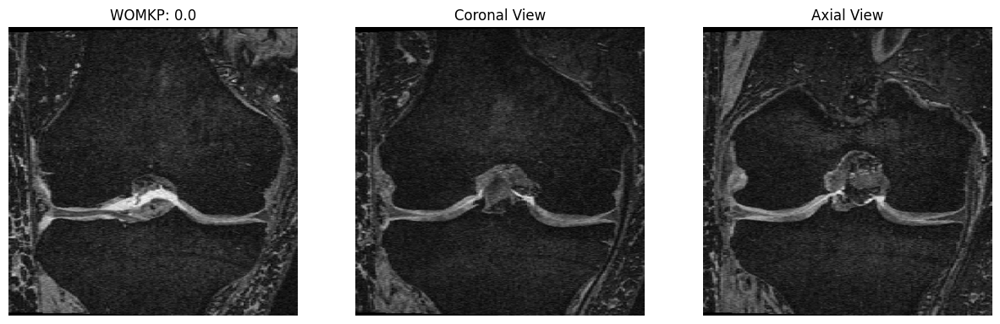

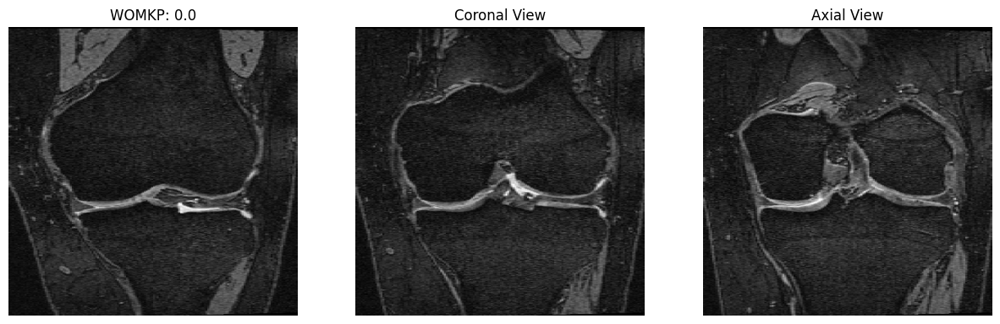

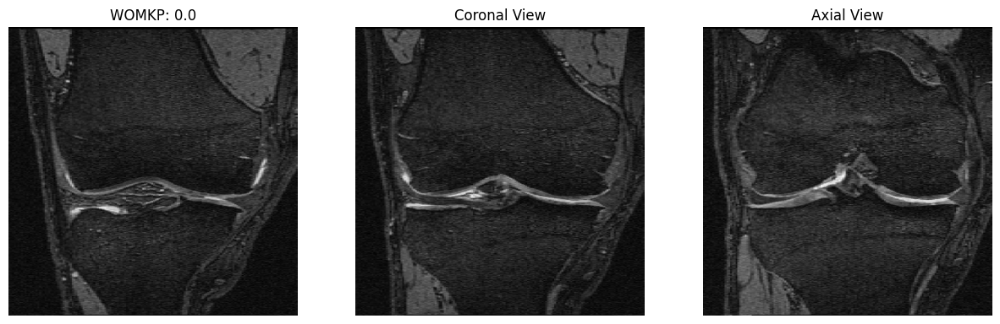

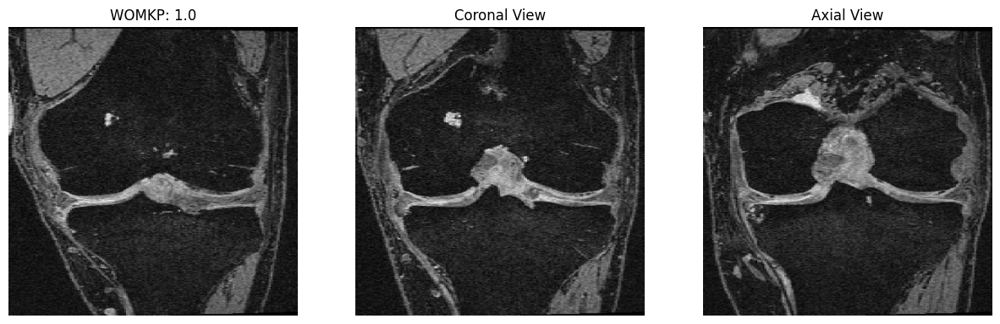

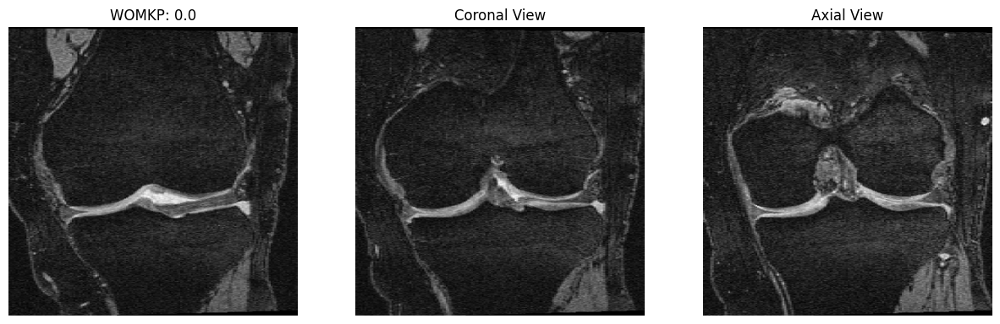

...

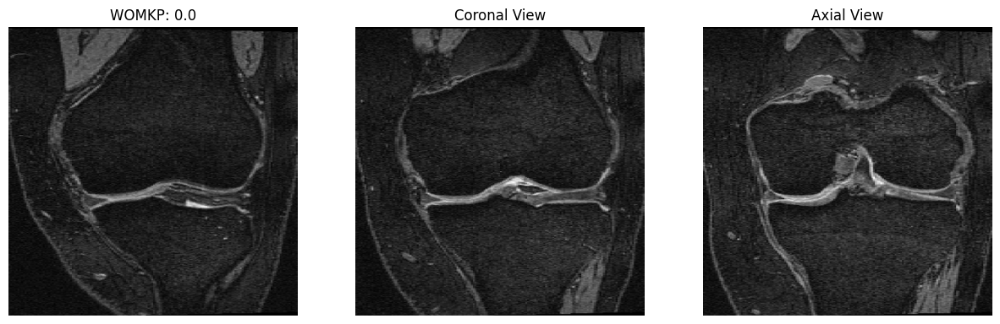

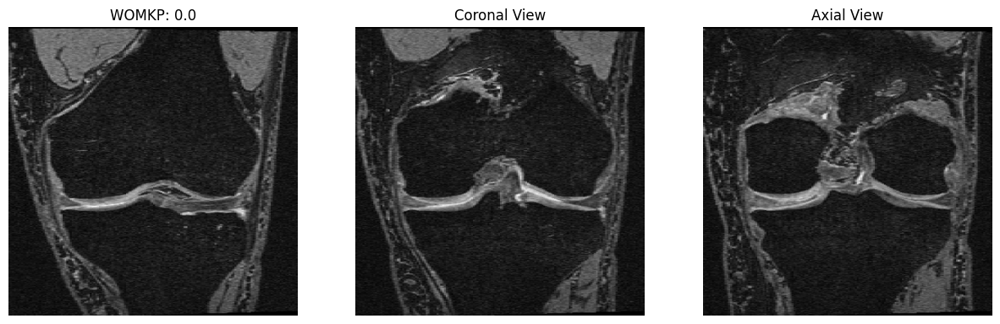

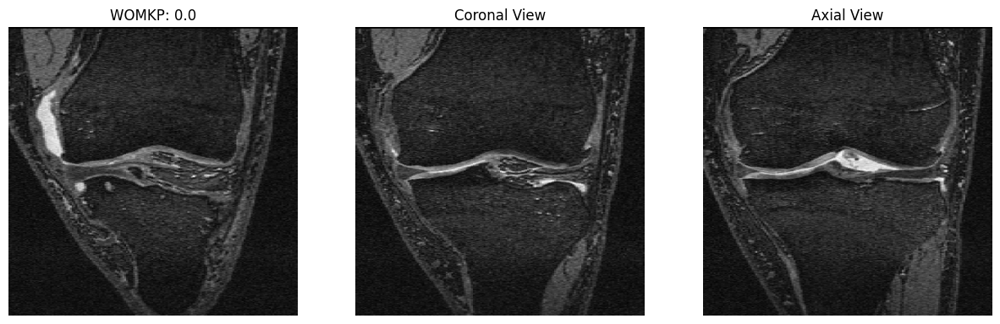

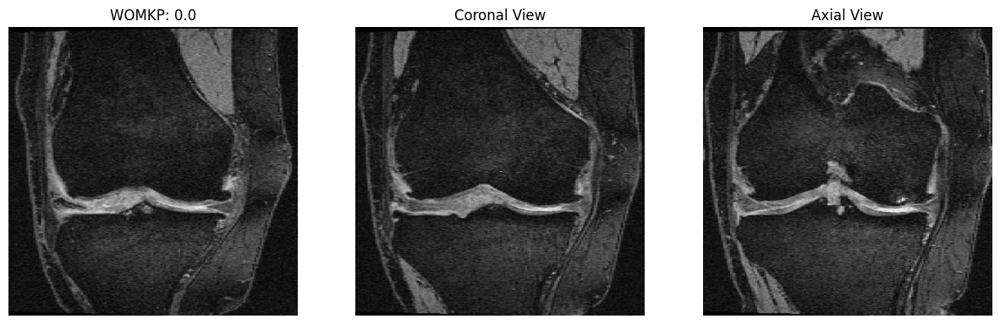

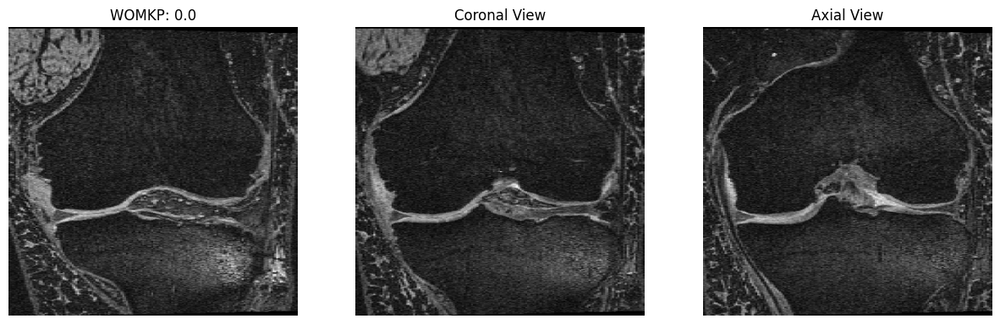

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def display_image_with_label(image, label):
    fig, axs = plt.subplots(1, 3, figsize=(15, 15))
    orientations = ['Sagittal', 'Coronal', 'Axial']
    for i in range(3):
        axs[i].imshow(image[i, :, :], cmap='gray')  # Assuming the image is already squeezed and in the correct format
        if i == 0:
            axs[i].set_title(f'{label}')  # Display label only on the first subplot
        else:
            axs[i].set_title(f'{orientations[i]} View')
        axs[i].axis('off')  # Hide axes for better visual presentation
    plt.show()

train_loader = data_loader.train_loader
print(len(train_loader))
print(len(data_loader.val_loader))
print(len(data_loader.test_loader))

for i, batch in enumerate(train_loader):
    print(batch)
    images = batch['image']  # Assuming images are in the 'image' key of the batch dictionary
    labels = batch['label']  # Assuming labels are in the 'label' key of the batch dictionary
    print(labels)
    print(labels)
    for j in range(len(images)):
        image = images[j]
        label_dict = {key: value[j] for key, value in labels.items()}  # Extract labels for the j-th image
        label_str = ", ".join([f"{k}: {v.item()}" for k, v in label_dict.items()])  # Convert label tensor to string
        display_image_with_label(image.numpy(), label_str)
    # Breaking after the first batch for demonstration purposes
    break

